In [1]:
import gc
import pathlib
from typing import Dict, List, Tuple, Union
import sys

from joblib import load
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import polars as pl
import seaborn as sns
from sklearn.metrics import average_precision_score, roc_auc_score
from sklearn.preprocessing import OrdinalEncoder

sys.path.append('..')

from scripts.evaluate import Evaluator
from scripts.get_depth_paths import get_depth_paths
from scripts.get_logger import get_logger
from scripts.merge_dataset import merge_dataset

gc.enable()
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', 100)

In [2]:
class PathHandler:
    competition_dir = pathlib.Path('../../inputs')
    parquet_files_dir = competition_dir.joinpath('parquet_files')
    feature_dir = pathlib.Path('../../outputs/features')
    model_dir = sorted(
        [p for p in pathlib.Path('../../outputs/output_catboost').glob('model_outputs*')]
    )[-1]


paths = PathHandler()

- P - Transform DPD (Days past due)
- M - Masking categories
- A - Transform amount
- D - Transform date
- T - Unspecified Transform
- L - Unspecified Transform

In [3]:
bool_features = pd.read_csv(paths.feature_dir.joinpath('bool_features.csv'))
float64_features = pd.read_csv(paths.feature_dir.joinpath('float64_features.csv'))
string_features = pd.read_csv(paths.feature_dir.joinpath('string_features.csv'))
date_features = pd.read_csv(paths.feature_dir.joinpath('date_features.csv'))

bool_features['cast_dtype'] = pl.Int8
float64_features['cast_dtype'] = pl.Float32
string_features['cast_dtype'] = pl.String
date_features['cast_dtype'] = pl.Date

cast_features = pd.concat([bool_features, float64_features, string_features])
display(cast_features)

,Variable,Description,train_num_unique_values,train_unique_types,train_num_nan,train_files,train_num_unique_types,test_num_unique_values,test_unique_types,test_num_nan,test_files,test_num_unique_types,transform,cast_dtype
0,remitter_829L,Flag indicating whether the client is a remitter.,2,bool,2168942,['person_1'],1,2,bool,7,['person_1'],1,L,Int8
1,contaddr_matchlist_1032L,Indicates whether the contact address is found in a code list.,2,bool,1447773,['person_1'],1,2,bool,7,['person_1'],1,L,Int8
2,isbidproduct_1095L,Flag indicating if the product is a cross-sell.,2,bool,0,['static_0'],1,2,bool,0,['static_0'],1,L,Int8
3,isdebitcard_729L,Flag indicating if the product is a debit card.,2,bool,1334357,['static_0'],1,2,bool,9,['static_0'],1,L,Int8
4,contaddr_smempladdr_334L,Indicates whether the contact address is the same as the employment address.,3,bool,1447773,['person_1'],1,2,bool,7,['person_1'],1,L,Int8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,addres_role_871L,Role of person's address.,9,str,1575736,['person_2'],1,1,NaN,10,['person_2'],0,L,String
95,cacccardblochreas_147M,Card blocking reason.,10,str,109249,['applprev_2'],1,1,NaN,10,['applprev_2'],0,M,String
96,relatedpersons_role_762T,"Relationship type of a client's related person (num_group1 - person, num_group2 - related person).",11,str,1614684,['person_2'],1,1,NaN,10,['person_2'],0,T,String
97,riskassesment_302T,Estimated probability that the client will default on their credit obligation within the next year.,17,str,1446917,['static_cb_0'],1,1,NaN,10,['static_cb_0'],0,T,String


In [4]:
display(string_features.query('transform=="M"'))

,Variable,Description,train_num_unique_values,train_unique_types,train_num_nan,train_files,train_num_unique_types,test_num_unique_values,test_unique_types,test_num_nan,test_files,test_num_unique_types,transform,cast_dtype
4,description_5085714M,Categorization of clients by credit bureau.,2,str,0,['static_cb_0'],1,2,str,0,['static_cb_0'],1,M,String
5,language1_981M,The primary language of the person.,3,str,0,['person_1'],1,3,str,0,['person_1'],1,M,String
16,collater_typofvalofguarant_298M,Collateral valuation type (active contract).,5,str,0,['credit_bureau_a_2'],1,3,str,0,['credit_bureau_a_2'],1,M,String
17,education_88M,Education level of the client.,5,str,0,['static_cb_0'],1,1,str,0,['static_cb_0'],1,M,String
18,education_1103M,Level of education of the client provided by external source.,5,str,0,['static_cb_0'],1,2,str,0,['static_cb_0'],1,M,String
19,subjectrole_43M,Subject role in closed credit contract.,6,str,0,['credit_bureau_b_1'],1,2,str,0,['credit_bureau_b_1'],1,M,String
20,subjectrole_326M,Subject role in active credit contract.,6,str,0,['credit_bureau_b_1'],1,2,str,0,['credit_bureau_b_1'],1,M,String
21,maritalst_893M,Marital status of the client,6,str,0,['static_cb_0'],1,1,str,0,['static_cb_0'],1,M,String
22,education_1138M,Applicant's education level from their previous application.,6,str,0,['applprev_1'],1,4,str,0,['applprev_1'],1,M,String
23,education_927M,Education level of the person.,6,str,0,['person_1'],1,2,str,0,['person_1'],1,M,String


### load feature definition, out-of-fold and feature importances.

In [5]:
feature_definition = pd.read_csv(paths.competition_dir.joinpath('feature_definitions.csv'))
oof = pd.read_csv(paths.model_dir.joinpath('oof.csv'))
oof = oof.query('probability != -1')
outcome = pd.read_csv(paths.model_dir.joinpath('outcome.csv'))
fimps = pd.read_csv(paths.model_dir.joinpath('feature_importances.csv'), index_col='processed_Variable')

base_variables = []
for v1 in feature_definition['Variable'].to_list():
    for v2 in fimps.index.to_list():
        if v1 in v2:
            base_variables.append((v2, v1))
base_variables = pd.DataFrame(base_variables)
base_variables.columns = ['processed_Variable', 'Variable']
fimps = fimps.merge(base_variables, on='processed_Variable')
fimps = fimps.merge(feature_definition, left_on='Variable', right_on='Variable')
fimps['transform'] = fimps['Variable'].map(lambda x: x[-1])
fimps['depth'] = fimps['processed_Variable'].map(lambda x: x[-1])

display(fimps)
display(feature_definition)
display(oof)
display(outcome)

,processed_Variable,fold_1_fimp,fold_2_fimp,fold_3_fimp,fold_4_fimp,fold_5_fimp,fimp_mean,fimp_std,Variable,Description,transform,depth
0,median_max_pmts_month_158T_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,pmts_month_158T,"Month of payment for a closed contract (num_group1 - existing contract, num_group2 - payment).",T,2
1,day_dateofbirth_337D_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,dateofbirth_337D,Client's date of birth.,D,0
2,day_first_birth_259D_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,birth_259D,Date of birth of the person.,D,1
3,lastapprcommoditytypec_5251766M_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,lastapprcommoditytypec_5251766M,Commodity type of the last application.,M,0
4,lastrejectcommodtypec_5251769M_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,lastrejectcommodtypec_5251769M,Commodity type of the last rejected application.,M,0
...,...,...,...,...,...,...,...,...,...,...,...,...
692,price_1097A_0,1.383911,1.667966,1.023332,1.936661,2.192372,1.640848,0.409820,price_1097A,Credit price.,A,0
693,pmtnum_254L_0,2.155841,2.289697,0.886837,1.255836,2.511078,1.819858,0.632466,pmtnum_254L,Total number of loan payments made by the client.,L,0
694,year_first_birth_259D_1,1.966023,2.605177,1.334371,1.631208,1.687135,1.844783,0.429857,birth_259D,Date of birth of the person.,D,1
695,first_incometype_1044T_1,1.312787,2.301500,1.157830,2.457536,2.168628,1.879656,0.536242,incometype_1044T,Type of income of the person,T,1


,Variable,Description
0,actualdpd_943P,Days Past Due (DPD) of previous contract (actual).
1,actualdpdtolerance_344P,DPD of client with tolerance.
2,addres_district_368M,District of the person's address.
3,addres_role_871L,Role of person's address.
4,addres_zip_823M,Zip code of the address.
...,...,...
460,totinstallast1m_4525188A,Total amount of monthly instalments paid in the previous month.
461,twobodfilling_608L,Type of application process.
462,type_25L,Contact type of a person.
463,typesuite_864L,Persons accompanying the client during the loan application process.


,case_id,date_decision,MONTH,WEEK_NUM,target,probability,fold
12326,12326,2019-04-25,201904,16,0,0.065619,0.0
12430,12430,2019-04-23,201904,16,0,0.020100,0.0
12467,12467,2019-04-23,201904,16,0,0.008718,0.0
12470,12470,2019-04-24,201904,16,0,0.035574,0.0
12479,12479,2019-04-24,201904,16,0,0.009516,0.0
...,...,...,...,...,...,...,...
1526654,2703450,2020-10-05,202010,91,0,0.002778,4.0
1526655,2703451,2020-10-05,202010,91,0,0.006286,4.0
1526656,2703452,2020-10-05,202010,91,0,0.029250,4.0
1526657,2703453,2020-10-05,202010,91,0,0.003215,4.0


,stability,slope,intercept
0,0.66881,0.000732,0.644754


### show feature importances

,processed_Variable,fold_1_fimp,fold_2_fimp,fold_3_fimp,fold_4_fimp,fold_5_fimp,fimp_mean,fimp_std,Variable,Description,transform,depth
0,median_max_pmts_month_158T_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,pmts_month_158T,"Month of payment for a closed contract (num_group1 - existing contract, num_group2 - payment).",T,2
23,mastercontrelectronic_519L_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,mastercontrelectronic_519L,Flag indicating the existence of the master contract for the client.,L,0
22,day_birthdate_574D_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,birthdate_574D,Client's date of birth (credit bureau data).,D,0
21,sum_residualamount_488A_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,residualamount_488A,Residual amount of a closed contract.,A,1
19,ratio_personindex_1023L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,personindex_1023L,Order of the person specified on the application form.,L,1
...,...,...,...,...,...,...,...,...,...,...,...,...
692,price_1097A_0,1.383911,1.667966,1.023332,1.936661,2.192372,1.640848,0.409820,price_1097A,Credit price.,A,0
693,pmtnum_254L_0,2.155841,2.289697,0.886837,1.255836,2.511078,1.819858,0.632466,pmtnum_254L,Total number of loan payments made by the client.,L,0
694,year_first_birth_259D_1,1.966023,2.605177,1.334371,1.631208,1.687135,1.844783,0.429857,birth_259D,Date of birth of the person.,D,1
695,first_incometype_1044T_1,1.312787,2.301500,1.157830,2.457536,2.168628,1.879656,0.536242,incometype_1044T,Type of income of the person,T,1


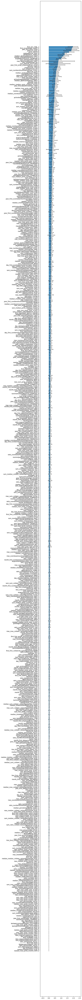

In [6]:
fimps.sort_values('fimp_mean', inplace=True)
display(fimps)

_, ax = plt.subplots(figsize=(8, 16*(len(fimps)//100)))
ax.barh(y=fimps['processed_Variable'], width=fimps['fimp_mean'], xerr=fimps['fimp_std'], capsize=3)
plt.tight_layout()
plt.show()

In [7]:
fimp_q50 = fimps['fimp_mean'].quantile(0.75)
print(fimp_q50)

fimps['smaller_than_q50'] = fimps['fimp_mean'] < fimp_q50
display(fimps)
display(fimps['smaller_than_q50'].sum())

0.1705996065261079


,processed_Variable,fold_1_fimp,fold_2_fimp,fold_3_fimp,fold_4_fimp,fold_5_fimp,fimp_mean,fimp_std,Variable,Description,transform,depth,smaller_than_q50
0,median_max_pmts_month_158T_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,pmts_month_158T,"Month of payment for a closed contract (num_group1 - existing contract, num_group2 - payment).",T,2,True
23,mastercontrelectronic_519L_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,mastercontrelectronic_519L,Flag indicating the existence of the master contract for the client.,L,0,True
22,day_birthdate_574D_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,birthdate_574D,Client's date of birth (credit bureau data).,D,0,True
21,sum_residualamount_488A_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,residualamount_488A,Residual amount of a closed contract.,A,1,True
19,ratio_personindex_1023L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,personindex_1023L,Order of the person specified on the application form.,L,1,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
692,price_1097A_0,1.383911,1.667966,1.023332,1.936661,2.192372,1.640848,0.409820,price_1097A,Credit price.,A,0,False
693,pmtnum_254L_0,2.155841,2.289697,0.886837,1.255836,2.511078,1.819858,0.632466,pmtnum_254L,Total number of loan payments made by the client.,L,0,False
694,year_first_birth_259D_1,1.966023,2.605177,1.334371,1.631208,1.687135,1.844783,0.429857,birth_259D,Date of birth of the person.,D,1,False
695,first_incometype_1044T_1,1.312787,2.301500,1.157830,2.457536,2.168628,1.879656,0.536242,incometype_1044T,Type of income of the person,T,1,False


522

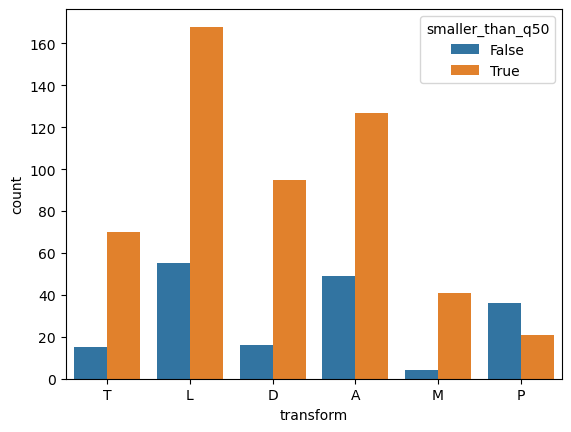

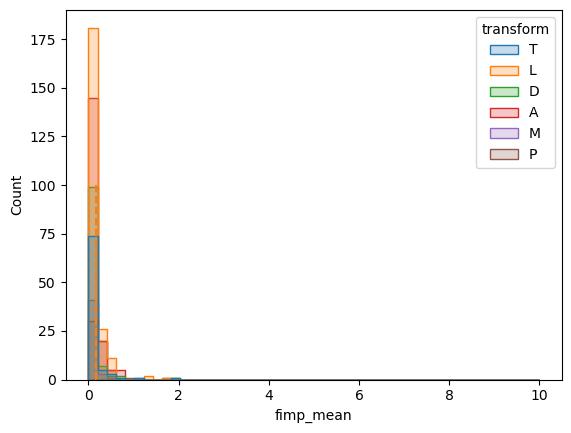

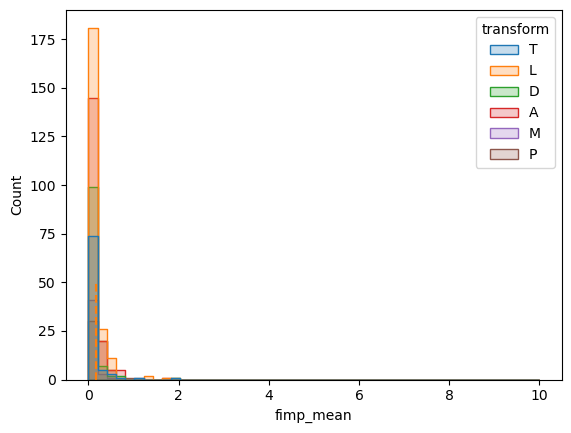

In [8]:
sns.countplot(data=fimps, x='transform', hue='smaller_than_q50')
plt.show()

_, ax = plt.subplots()
bins = np.linspace(0, 10, 50)
sns.histplot(data=fimps, x='fimp_mean', hue='transform', element='step', bins=bins, ax=ax)
ax.vlines(fimp_q50, ymin=0, ymax=100, color='tab:orange', linestyles='dashed')
plt.show()

_, ax = plt.subplots()
bins = np.linspace(0, 10, 50)
sns.histplot(data=fimps, x='fimp_mean', hue='transform', element='step', bins=bins, ax=ax)
ax.vlines(fimp_q50, ymin=0, ymax=50, color='tab:orange', linestyles='dashed')
plt.show()

### load train data

In [9]:
train_depth_paths = get_depth_paths(paths.parquet_files_dir, 'train')
print(f'number of test paths: {sum(len(v1) for v1 in train_depth_paths.values())}')

train_base_data = pl.read_parquet(
    paths.parquet_files_dir.joinpath('train/train_base.parquet')
)
train_base_data = train_base_data.cast(
    {
        'case_id': pl.Int64,
        'date_decision': pl.String,
        'MONTH': pl.Int64,
        'WEEK_NUM': pl.Int64,
        'target': pl.Int64,
    }
)
display(train_base_data)

number of test paths: 31


case_id,date_decision,MONTH,WEEK_NUM,target
i64,str,i64,i64,i64
0,"""2019-01-03""",201901,0,0
1,"""2019-01-03""",201901,0,0
2,"""2019-01-04""",201901,0,0
3,"""2019-01-03""",201901,0,0
4,"""2019-01-04""",201901,0,1
…,…,…,…,…
2703450,"""2020-10-05""",202010,91,0
2703451,"""2020-10-05""",202010,91,0
2703452,"""2020-10-05""",202010,91,0


In [10]:
%%time


depth_data = merge_dataset(
    train_base_data,
    train_depth_paths,
    bool_features,
    float64_features,
    string_features,
    date_features,
    None,
    '012'
)
display(depth_data)
display(depth_data.dtypes.value_counts())

loading `static_0`
	(1003757, 168)
	(522902, 168)
loading `static_cb_0`
	(1500476, 53)
loading `applprev_1`
	(782997, 91)
	(438525, 91)
loading `other_1`
	(51109, 21)
loading `tax_registry_a_1`
	(457934, 6)
loading `tax_registry_b_1`
	(150732, 7)
loading `tax_registry_c_1`
	(482265, 6)
loading `credit_bureau_a_1`
	(335275, 240)
	(549263, 240)
	(325127, 240)
	(176608, 240)
loading `credit_bureau_b_1`
	(36500, 134)
loading `deposit_1`
	(105111, 7)
loading `person_1`
	(1526659, 43)
loading `debitcard_1`
	(111772, 14)
loading `applprev_2`
	(1221522, 4)
loading `person_2`
	(1435105, 7)
loading `credit_bureau_a_2`
	(98303, 127)
	(118481, 127)
	(23734, 127)
	(156749, 127)
	(190486, 127)
	(190313, 127)
	(231250, 127)
	(150426, 127)
	(45056, 127)
	(77457, 127)
	(103033, 127)
loading `credit_bureau_b_2`
	(36447, 26)


,case_id,date_decision,MONTH,WEEK_NUM,target,actualdpdtolerance_344P_0,amtinstpaidbefduel24m_4187115A_0,annuity_780A_0,annuitynextmonth_57A_0,applicationcnt_361L_0,...,day_first_contractmaturitydate_151D_1,day_first_lastupdate_260D_1,day_first_contractenddate_991D_1,day_first_openingdate_313D_1,day_first_birth_259D_1,day_first_birthdate_87D_1,day_first_empl_employedfrom_271D_1,day_first_openingdate_857D_1,day_first_first_empls_employedfrom_796D_2,day_first_first_pmts_date_1107D_2
0,0,2019-01-03,201901,0,0,NaN,NaN,1917.599976,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,15.0,NaN,NaN,NaN
1,1,2019-01-03,201901,0,0,NaN,NaN,3134.000000,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,29.0,NaN,NaN,NaN
2,2,2019-01-04,201901,0,0,NaN,NaN,4937.000000,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,15.0,NaN,NaN,NaN
3,3,2019-01-03,201901,0,0,NaN,NaN,4643.600098,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,15.0,NaN,NaN,NaN
4,4,2019-01-04,201901,0,1,NaN,NaN,3390.199951,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,15.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1526654,2703450,2020-10-05,202010,91,0,0.0,176561.359375,3675.400146,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1526655,2703451,2020-10-05,202010,91,0,0.0,301276.468750,7088.600098,6191.600098,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1526656,2703452,2020-10-05,202010,91,0,0.0,14232.400391,7788.800293,0.000000,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1526657,2703453,2020-10-05,202010,91,0,0.0,197371.578125,1195.400024,2827.199951,0.0,...,NaN,NaN,28.0,29.0,1.0,NaN,NaN,29.0,NaN,NaN


float32    955
object      92
int8         6
int64        4
Name: count, dtype: int64

CPU times: user 17min 3s, sys: 36.7 s, total: 17min 40s
Wall time: 1min 8s


In [11]:
nans = (depth_data.isna().sum() / len(depth_data)).reset_index()
nans.columns = ['processed_Variable', 'ratio_nan']

display(fimps)
display(nans)

fimps = fimps.merge(nans, on='processed_Variable', how='left')
display(fimps)

,processed_Variable,fold_1_fimp,fold_2_fimp,fold_3_fimp,fold_4_fimp,fold_5_fimp,fimp_mean,fimp_std,Variable,Description,transform,depth,smaller_than_q50
0,median_max_pmts_month_158T_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,pmts_month_158T,"Month of payment for a closed contract (num_group1 - existing contract, num_group2 - payment).",T,2,True
23,mastercontrelectronic_519L_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,mastercontrelectronic_519L,Flag indicating the existence of the master contract for the client.,L,0,True
22,day_birthdate_574D_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,birthdate_574D,Client's date of birth (credit bureau data).,D,0,True
21,sum_residualamount_488A_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,residualamount_488A,Residual amount of a closed contract.,A,1,True
19,ratio_personindex_1023L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,personindex_1023L,Order of the person specified on the application form.,L,1,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
692,price_1097A_0,1.383911,1.667966,1.023332,1.936661,2.192372,1.640848,0.409820,price_1097A,Credit price.,A,0,False
693,pmtnum_254L_0,2.155841,2.289697,0.886837,1.255836,2.511078,1.819858,0.632466,pmtnum_254L,Total number of loan payments made by the client.,L,0,False
694,year_first_birth_259D_1,1.966023,2.605177,1.334371,1.631208,1.687135,1.844783,0.429857,birth_259D,Date of birth of the person.,D,1,False
695,first_incometype_1044T_1,1.312787,2.301500,1.157830,2.457536,2.168628,1.879656,0.536242,incometype_1044T,Type of income of the person,T,1,False


,processed_Variable,ratio_nan
0,case_id,0.000000
1,date_decision,0.000000
2,MONTH,0.000000
3,WEEK_NUM,0.000000
4,target,0.000000
...,...,...
1052,day_first_birthdate_87D_1,0.991840
1053,day_first_empl_employedfrom_271D_1,0.628797
1054,day_first_openingdate_857D_1,0.932508
1055,day_first_first_empls_employedfrom_796D_2,0.998201


,processed_Variable,fold_1_fimp,fold_2_fimp,fold_3_fimp,fold_4_fimp,fold_5_fimp,fimp_mean,fimp_std,Variable,Description,transform,depth,smaller_than_q50,ratio_nan
0,median_max_pmts_month_158T_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,pmts_month_158T,"Month of payment for a closed contract (num_group1 - existing contract, num_group2 - payment).",T,2,True,0.172044
1,mastercontrelectronic_519L_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,mastercontrelectronic_519L,Flag indicating the existence of the master contract for the client.,L,0,True,0.200450
2,day_birthdate_574D_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,birthdate_574D,Client's date of birth (credit bureau data).,D,0,True,0.601829
3,sum_residualamount_488A_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,residualamount_488A,Residual amount of a closed contract.,A,1,True,0.091956
4,ratio_personindex_1023L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,personindex_1023L,Order of the person specified on the application form.,L,1,True,0.612859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
692,price_1097A_0,1.383911,1.667966,1.023332,1.936661,2.192372,1.640848,0.409820,price_1097A,Credit price.,A,0,False,0.146228
693,pmtnum_254L_0,2.155841,2.289697,0.886837,1.255836,2.511078,1.819858,0.632466,pmtnum_254L,Total number of loan payments made by the client.,L,0,False,0.029446
694,year_first_birth_259D_1,1.966023,2.605177,1.334371,1.631208,1.687135,1.844783,0.429857,birth_259D,Date of birth of the person.,D,1,False,0.000000
695,first_incometype_1044T_1,1.312787,2.301500,1.157830,2.457536,2.168628,1.879656,0.536242,incometype_1044T,Type of income of the person,T,1,False,0.000000


#### plot feature importance per transform type

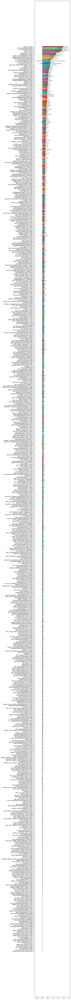

In [12]:
colors = np.array(['tab:orange'] * len(fimps))
colors[fimps['transform']=='A'] = 'tab:blue'
colors[fimps['transform']=='D'] = 'tab:green'
colors[fimps['transform']=='L'] = 'tab:red'
colors[fimps['transform']=='M'] = 'tab:purple'
colors[fimps['transform']=='T'] = 'tab:cyan'

_, ax = plt.subplots(figsize=(8, 16*len(fimps)//100))
ax.barh(
    y=fimps['processed_Variable'],
    width=fimps['fimp_mean'],
    xerr=fimps['fimp_std'],
    capsize=3,
    color=colors,
)
plt.tight_layout()
#plt.xscale('log')
plt.show()

#### plot feature importance per depth

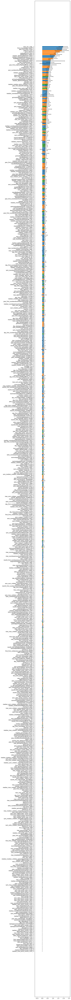

In [13]:
colors = np.array(['tab:orange'] * len(fimps))
colors[fimps['depth']=='1'] = 'tab:blue'
colors[fimps['depth']=='2'] = 'tab:green'

_, ax = plt.subplots(figsize=(8, 16*len(fimps)//100))
ax.barh(
    y=fimps['processed_Variable'],
    width=fimps['fimp_mean'],
    xerr=fimps['fimp_std'],
    capsize=3,
    color=colors,
)
plt.tight_layout()
#plt.xscale('log')
plt.show()

#### plot feature importance per number of nan

,processed_Variable,fold_1_fimp,fold_2_fimp,fold_3_fimp,fold_4_fimp,fold_5_fimp,fimp_mean,fimp_std,Variable,Description,transform,depth,smaller_than_q50,ratio_nan
0,median_max_pmts_month_158T_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,pmts_month_158T,"Month of payment for a closed contract (num_group1 - existing contract, num_group2 - payment).",T,2,True,0.172044
1,mastercontrelectronic_519L_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,mastercontrelectronic_519L,Flag indicating the existence of the master contract for the client.,L,0,True,0.200450
2,day_birthdate_574D_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,birthdate_574D,Client's date of birth (credit bureau data).,D,0,True,0.601829
3,sum_residualamount_488A_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,residualamount_488A,Residual amount of a closed contract.,A,1,True,0.091956
4,ratio_personindex_1023L_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,personindex_1023L,Order of the person specified on the application form.,L,1,True,0.612859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
692,price_1097A_0,1.383911,1.667966,1.023332,1.936661,2.192372,1.640848,0.409820,price_1097A,Credit price.,A,0,False,0.146228
693,pmtnum_254L_0,2.155841,2.289697,0.886837,1.255836,2.511078,1.819858,0.632466,pmtnum_254L,Total number of loan payments made by the client.,L,0,False,0.029446
694,year_first_birth_259D_1,1.966023,2.605177,1.334371,1.631208,1.687135,1.844783,0.429857,birth_259D,Date of birth of the person.,D,1,False,0.000000
695,first_incometype_1044T_1,1.312787,2.301500,1.157830,2.457536,2.168628,1.879656,0.536242,incometype_1044T,Type of income of the person,T,1,False,0.000000


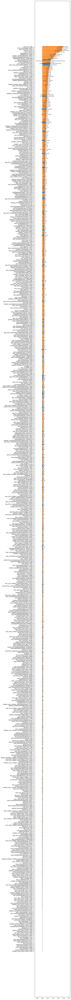

In [14]:
display(fimps)

colors = np.array(['tab:orange'] * len(fimps))
colors[fimps['ratio_nan'] > 0.5] = 'tab:blue'

_, ax = plt.subplots(figsize=(8, 16*len(fimps)//100))
ax.barh(
    y=fimps['processed_Variable'],
    width=fimps['fimp_mean'],
    xerr=fimps['fimp_std'],
    capsize=3,
    color=colors,
)
plt.tight_layout()
#plt.xscale('log')
plt.show()

#### plot feature importance per number of nan

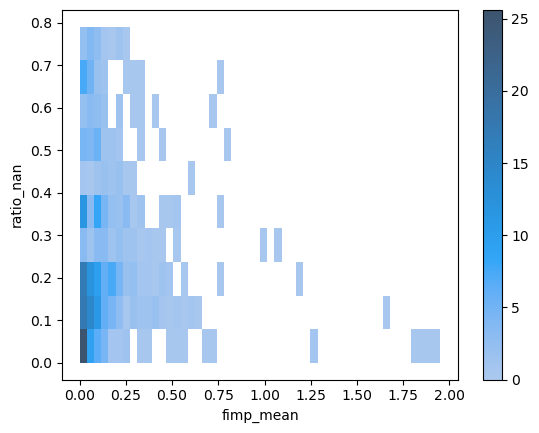

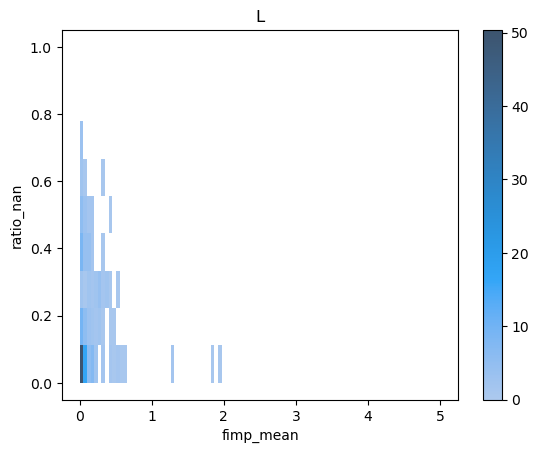

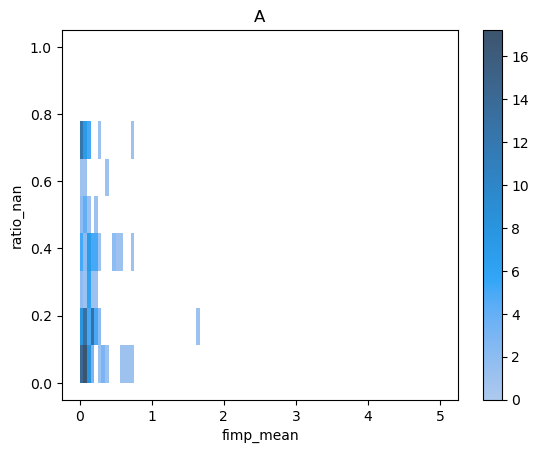

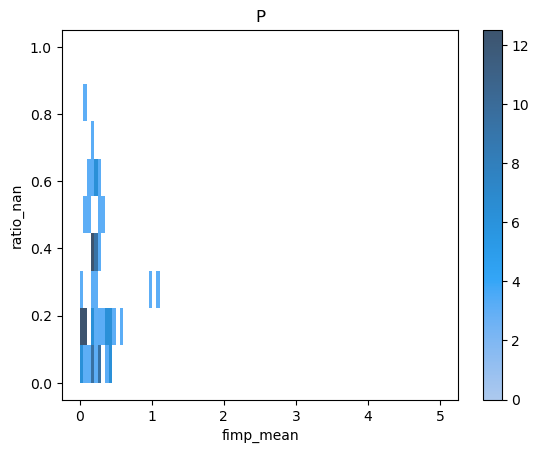

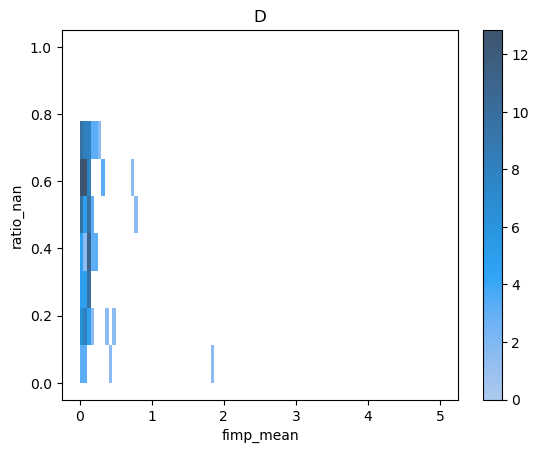

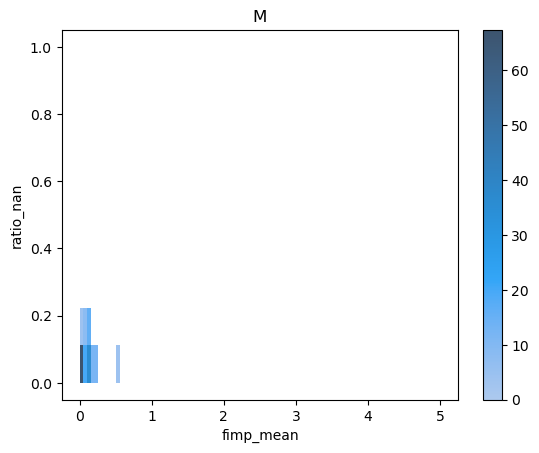

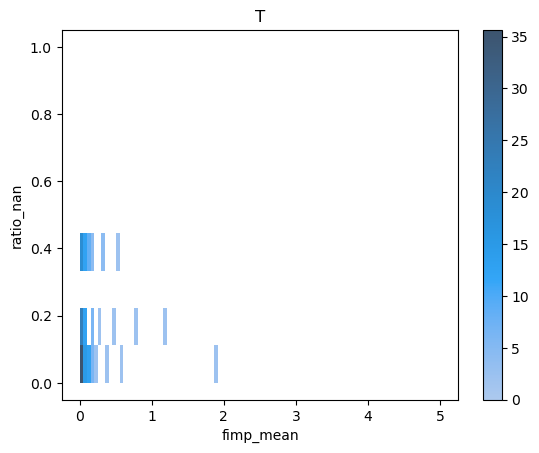

In [15]:
sns.histplot(
    data=fimps,
    x='fimp_mean',
    y='ratio_nan',
    bins=(50, 10),
    stat='density',
    cbar=True,
)
plt.show()


for t in ['L', 'A', 'P', 'D', 'M', 'T']:
    ax = sns.histplot(
        data=fimps.query('transform==@t'),
        x='fimp_mean',
        y='ratio_nan',
        bins=(np.linspace(0, 5, 100), np.linspace(0, 1, 10)),
        stat='density',
        cbar=True,
    )
    ax.set_title(t)
    plt.show()

#### plot M features

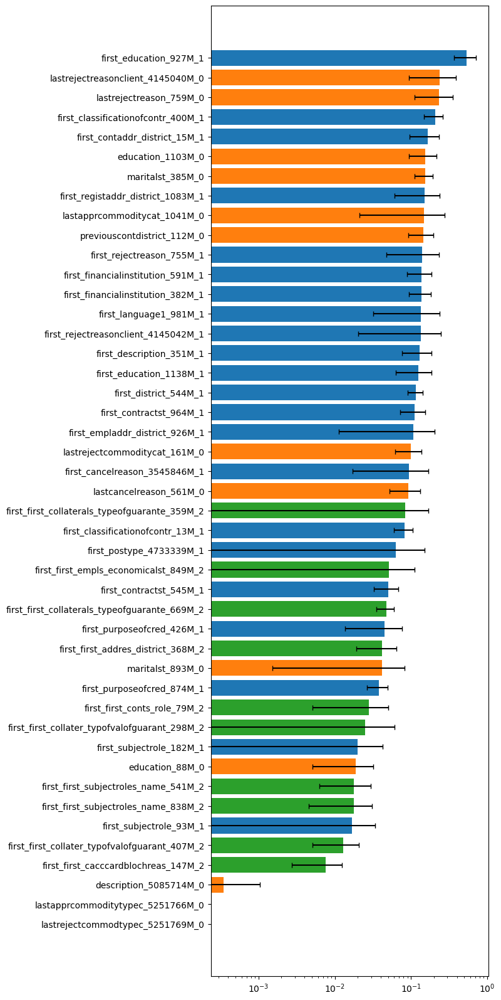

In [16]:
colors = np.array(['tab:orange'] * len(fimps.query('transform=="M"')))
colors[fimps.query('transform=="M"')['processed_Variable'].str.endswith('1')] = 'tab:blue'
colors[fimps.query('transform=="M"')['processed_Variable'].str.endswith('2')] = 'tab:green'

_, ax = plt.subplots(figsize=(8, 16))
ax.barh(
    y=fimps.query('transform=="M"')['processed_Variable'],
    width=fimps.query('transform=="M"')['fimp_mean'],
    xerr=fimps.query('transform=="M"')['fimp_std'],
    capsize=3,
    color=colors,
)
plt.tight_layout()
plt.xscale('log')
plt.show()

#### plot top k features

,processed_Variable,fimp_mean,fimp_std,Variable,Description,transform,depth
0,first_sex_738L_1,1.950687,0.409854,sex_738L,Gender of the client.,L,1
1,first_incometype_1044T_1,1.879656,0.536242,incometype_1044T,Type of income of the person,T,1
2,year_first_birth_259D_1,1.844783,0.429857,birth_259D,Date of birth of the person.,D,1
3,pmtnum_254L_0,1.819858,0.632466,pmtnum_254L,Total number of loan payments made by the client.,L,0
4,price_1097A_0,1.640848,0.409820,price_1097A,Credit price.,A,0
5,mobilephncnt_593L_0,1.277561,0.170178,mobilephncnt_593L,Number of persons with the same mobile phone number.,L,0
6,isbidproduct_1095L_0,1.276037,0.542818,isbidproduct_1095L,Flag indicating if the product is a cross-sell.,L,0
7,median_dpdmaxdateyear_596T_1,1.176881,0.438675,dpdmaxdateyear_596T,Year when maximum Days Past Due (DPD) occurred for the active contract.,T,1
8,median_maxdpdtolerance_577P_1,1.065237,0.245074,maxdpdtolerance_577P,Maximum DPD with tolerance (on previous application/s).,P,1
9,avgdpdtolclosure24_3658938P_0,1.001605,0.396557,avgdpdtolclosure24_3658938P,"Average DPD (days past due) with tolerance within the past 24 months from the maximum closure date, assuming that the contract is finished. If the contract is ongoing, the calculation is based on the current date.",P,0


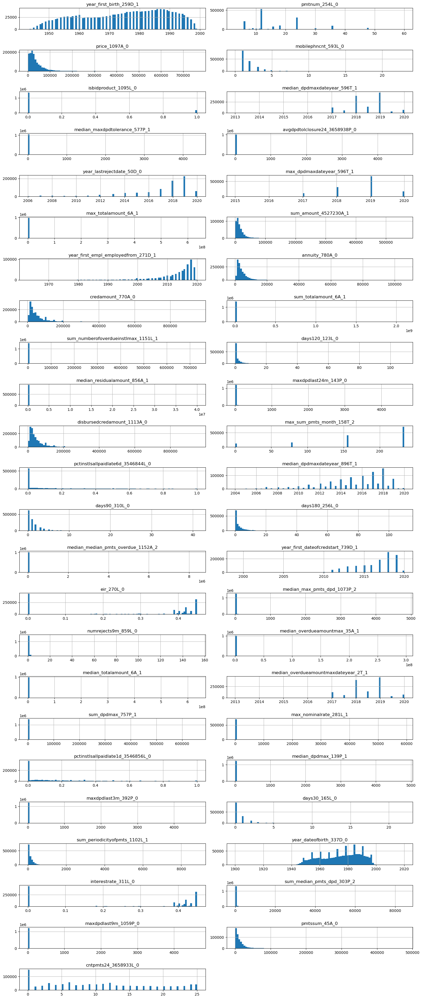

In [17]:
k = 50
topk_features = fimps.sort_values('fimp_mean', ascending=False).reset_index(drop=True).iloc[:k]
display(topk_features[['processed_Variable', 'fimp_mean', 'fimp_std', 'Variable', 'Description', 'transform', 'depth']])

_ = depth_data[topk_features['processed_Variable'].to_list()].hist(bins=100, layout=(len(topk_features)+1, 2), figsize=(16, 16*5))
plt.tight_layout()
plt.show()

,processed_Variable,fimp_mean,Variable,Description,transform,depth
3,pmtnum_254L_0,1.819858,pmtnum_254L,Total number of loan payments made by the client.,L,0
4,price_1097A_0,1.640848,price_1097A,Credit price.,A,0
5,mobilephncnt_593L_0,1.277561,mobilephncnt_593L,Number of persons with the same mobile phone number.,L,0
6,isbidproduct_1095L_0,1.276037,isbidproduct_1095L,Flag indicating if the product is a cross-sell.,L,0
9,avgdpdtolclosure24_3658938P_0,1.001605,avgdpdtolclosure24_3658938P,"Average DPD (days past due) with tolerance within the past 24 months from the maximum closure date, assuming that the contract is finished. If the contract is ongoing, the calculation is based on the current date.",P,0
10,year_lastrejectdate_50D_0,0.797831,lastrejectdate_50D,Date of most recent rejected application by the applicant.,D,0
15,annuity_780A_0,0.714999,annuity_780A,Monthly annuity amount.,A,0
16,credamount_770A_0,0.681117,credamount_770A,Loan amount or credit card limit.,A,0
19,days120_123L_0,0.586216,days120_123L,Number of credit bureau queries for the last 120 days.,L,0
21,maxdpdlast24m_143P_0,0.575306,maxdpdlast24m_143P,Maximal days past due in the last 24 months.,P,0


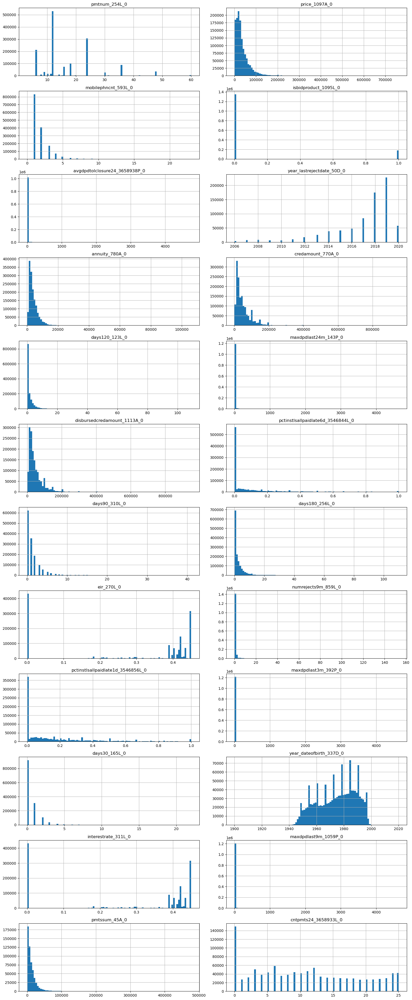

In [18]:
k = 50
topk_features = fimps.sort_values('fimp_mean', ascending=False).reset_index(drop=True).iloc[:k].query('depth=="0"')
display(topk_features[['processed_Variable', 'fimp_mean', 'Variable', 'Description', 'transform', 'depth']])

_ = depth_data[topk_features['processed_Variable'].to_list()].hist(bins=100, layout=(len(topk_features)+1, 2), figsize=(16, 16*5))
plt.tight_layout()
plt.show()

### plot probability per week

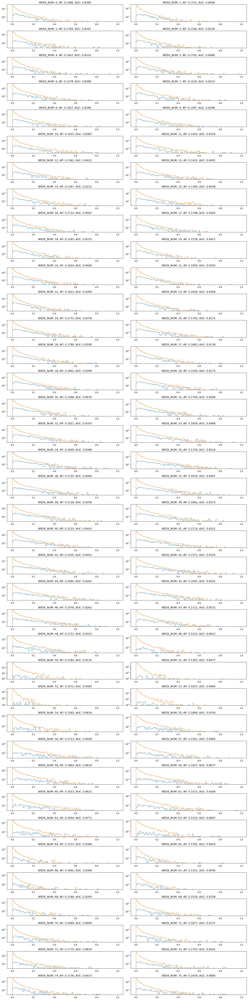

In [19]:
def plot_probability(oof):
    _, axs = plt.subplots(oof['WEEK_NUM'].nunique()//2, 2, figsize=(16, 64))
    bins = np.linspace(0, 1, 100)
    for i, (_, g) in enumerate(oof.groupby('WEEK_NUM')[['probability', 'target']]):
        ap = average_precision_score(g['target'], g['probability'])
        auc = roc_auc_score(g['target'], g['probability'])
        axs[i//2, i%2].hist(g.query('target==1')['probability'], bins=bins, histtype='step')
        axs[i//2, i%2].hist(g.query('target==0')['probability'], bins=bins, histtype='step')
        axs[i//2, i%2].set_yscale('log')
        axs[i//2, i%2].set_title(f'WEEK_NUM: {i}, AP: {ap:.4f}, AUC: {auc:.4f}')
    plt.tight_layout()
    plt.show()


plot_probability(oof)

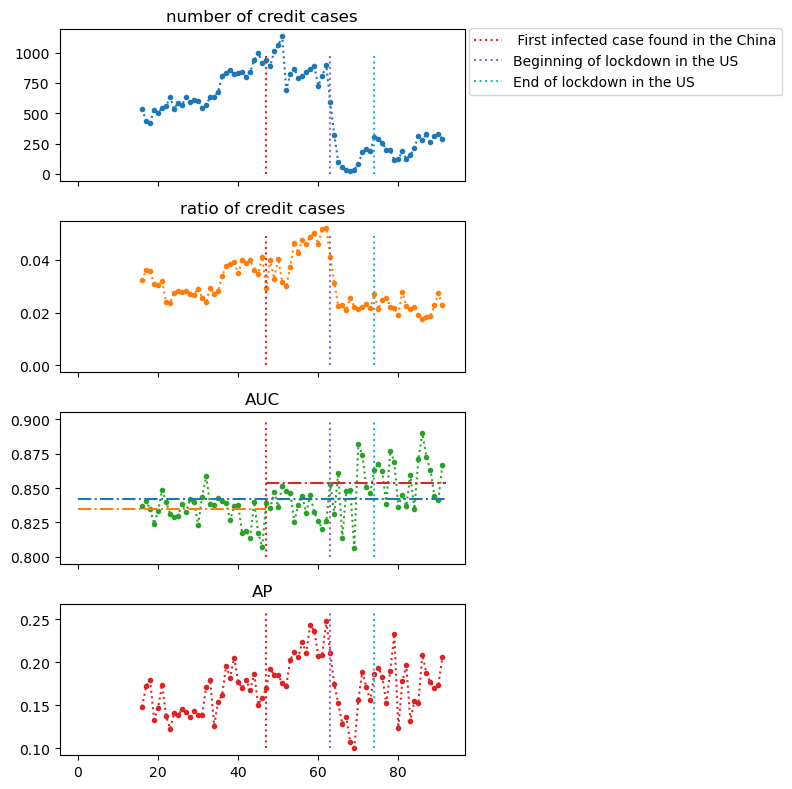

In [20]:
num_target_per_week = oof.groupby('WEEK_NUM')['target'].sum()
ratio_target_per_week = oof.groupby('WEEK_NUM')['target'].agg(lambda x: x.sum() / len(x))
auc_per_week = oof.groupby('WEEK_NUM')[['probability', 'target']].apply(lambda x: roc_auc_score(x['target'], x['probability']))
ap_per_week = oof.groupby('WEEK_NUM')[['probability', 'target']].apply(lambda x: average_precision_score(x['target'], x['probability']))

_, axs = plt.subplots(4, 1, figsize=(8, 8), sharex=True)
axs[0].plot(num_target_per_week, marker='.', linestyle=':')
axs[1].plot(ratio_target_per_week, marker='.', linestyle=':', color='tab:orange')
axs[2].plot(auc_per_week, marker='.', linestyle=':', color='tab:green')
axs[3].plot(ap_per_week, marker='.', linestyle=':', color='tab:red')

axs[0].set_title('number of credit cases')
axs[1].set_title('ratio of credit cases')
axs[2].set_title('AUC')
axs[3].set_title('AP')

axs[0].vlines(47, 0, 1000, color='tab:red', linestyle=':', label=' First infected case found in the China')
axs[1].vlines(47, 0, 0.05, color='tab:red', linestyle=':')
axs[2].vlines(47, 0.8, 0.9, color='tab:red', linestyle=':')
axs[3].vlines(47, 0.1, 0.26, color='tab:red', linestyle=':')

axs[0].vlines(63, 0, 1000, color='tab:purple', linestyle=':', label='Beginning of lockdown in the US')
axs[1].vlines(63, 0, 0.05, color='tab:purple', linestyle=':')
axs[2].vlines(63, 0.8, 0.9, color='tab:purple', linestyle=':')
axs[3].vlines(63, 0.1, 0.26, color='tab:purple', linestyle=':')

axs[0].vlines(74, 0, 1000, color='tab:cyan', linestyle=':', label='End of lockdown in the US')
axs[1].vlines(74, 0, 0.05, color='tab:cyan', linestyle=':')
axs[2].vlines(74, 0.8, 0.9, color='tab:cyan', linestyle=':')
axs[3].vlines(74, 0.1, 0.26, color='tab:cyan', linestyle=':')

axs[2].hlines(auc_per_week.mean(), 0, 92, color='tab:blue', linestyle='-.')
axs[2].hlines(auc_per_week[:47].mean(), 0, 47, color='tab:orange', linestyle='-.')
axs[2].hlines(auc_per_week[47:].mean(), 47, 92, color='tab:red', linestyle='-.')

axs[0].legend(bbox_to_anchor=(1.01, 1.01), borderaxespad=0)

plt.tight_layout()
plt.show()

### save selected features

In [21]:
selected_features = fimps.sort_values('fimp_mean', ascending=False).reset_index(drop=True)
display(selected_features)

selected_features.to_csv(paths.feature_dir.joinpath(f'catboost_{paths.model_dir.stem}_selected_features.csv'), index=False)

,processed_Variable,fold_1_fimp,fold_2_fimp,fold_3_fimp,fold_4_fimp,fold_5_fimp,fimp_mean,fimp_std,Variable,Description,transform,depth,smaller_than_q50,ratio_nan
0,first_sex_738L_1,1.279207,1.819057,1.988070,2.137182,2.529920,1.950687,0.409854,sex_738L,Gender of the client.,L,1,False,0.000000
1,first_incometype_1044T_1,1.312787,2.301500,1.157830,2.457536,2.168628,1.879656,0.536242,incometype_1044T,Type of income of the person,T,1,False,0.000000
2,year_first_birth_259D_1,1.966023,2.605177,1.334371,1.631208,1.687135,1.844783,0.429857,birth_259D,Date of birth of the person.,D,1,False,0.000000
3,pmtnum_254L_0,2.155841,2.289697,0.886837,1.255836,2.511078,1.819858,0.632466,pmtnum_254L,Total number of loan payments made by the client.,L,0,False,0.029446
4,price_1097A_0,1.383911,1.667966,1.023332,1.936661,2.192372,1.640848,0.409820,price_1097A,Credit price.,A,0,False,0.146228
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
692,max_max_pmts_month_158T_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,pmts_month_158T,"Month of payment for a closed contract (num_group1 - existing contract, num_group2 - payment).",T,2,True,0.172044
693,lastapprcommoditytypec_5251766M_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,lastapprcommoditytypec_5251766M,Commodity type of the last application.,M,0,True,0.000000
694,day_first_birth_259D_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,birth_259D,Date of birth of the person.,D,1,True,0.000000
695,day_dateofbirth_337D_0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,dateofbirth_337D,Client's date of birth.,D,0,True,0.092338


0 91


<Axes: xlabel='WEEK_NUM'>

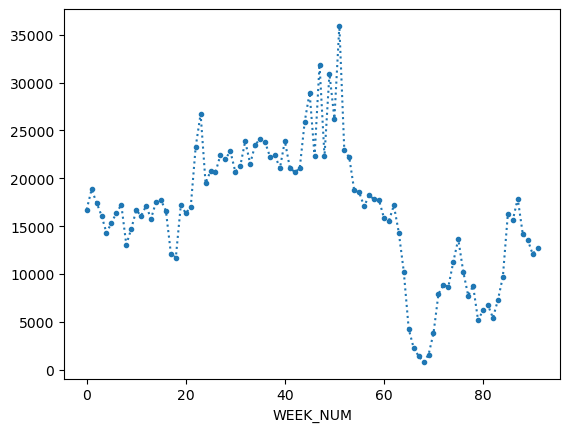

In [22]:
print(depth_data['WEEK_NUM'].min(), depth_data['WEEK_NUM'].max())
depth_data['WEEK_NUM'].value_counts().sort_index().plot(marker='.', linestyle=':')

In [23]:
m = fimps['fimp_mean'].mean()
len(fimps.query('fimp_mean > @m'))

216